<a href="https://colab.research.google.com/github/Raguwing/Deep_learning_projects/blob/main/NUNC_SYSTEMS_Assignment_Task_File.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Auto-Mobile Image Classification Assignment Task

## Import Libraries

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#!pip install tensorflow

In [76]:
# Load the TensorBoard notebook extension.
%load_ext tensorboard # It is a visualization tool provided by tensorflow similar to mlflow which is useful in monitoring model performance, its graphs and artifacts tec.

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [77]:
%reload_ext tensorboard

In [78]:
import tensorflow as tf
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras import Sequential, Model
from tensorflow.keras.activations import softmax
from tensorflow.keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator
#please import any required libraries

import pandas as pd
import seaborn as sns
import os
import datetime
import tensorboard
from tensorflow import keras
import cv2
from PIL import Image, ImageEnhance, ImageFilter
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Dense, Flatten, Dropout, BatchNormalization
from tensorflow.keras.metrics import Precision, Recall
import time
from tensorflow.keras.applications.resnet50 import ResNet50

In [54]:
# data is in "data" folder, contains 9 classes. Please build an image classification model to classify images.

## Read and Analyse the Data

In [55]:
#please analyse the data and figure if data requires any pre-processing or augmentation.

>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
/content/drive/MyDrive/data/3_4th_driver_side_rear--> Total images:  500
Image_shape:  (480, 640, 3)
Image_dimensions:  3
Image_size:  921600


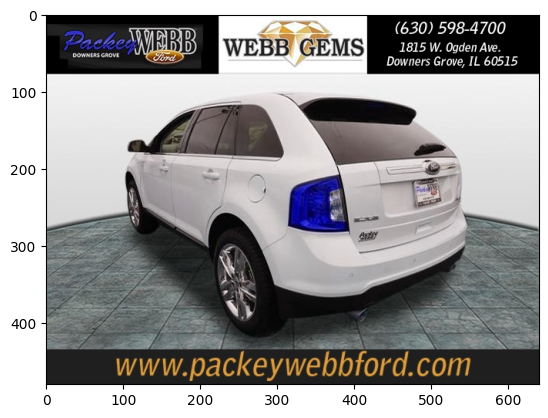

>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
/content/drive/MyDrive/data/passenger_side--> Total images:  500
Image_shape:  (768, 1024, 3)
Image_dimensions:  3
Image_size:  2359296


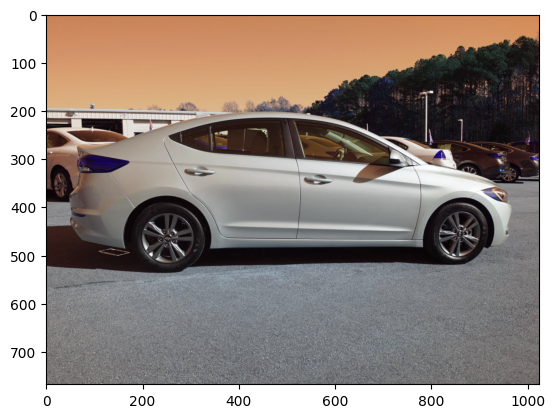

>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
/content/drive/MyDrive/data/unknown--> Total images:  500
Image_shape:  (768, 1024, 3)
Image_dimensions:  3
Image_size:  2359296


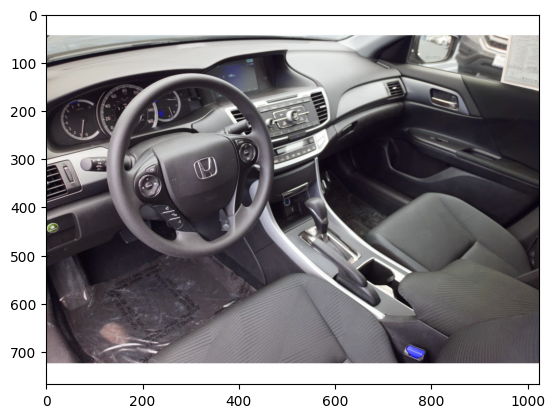

>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
/content/drive/MyDrive/data/3_4th_driver_side_front--> Total images:  500
Image_shape:  (768, 1024, 3)
Image_dimensions:  3
Image_size:  2359296


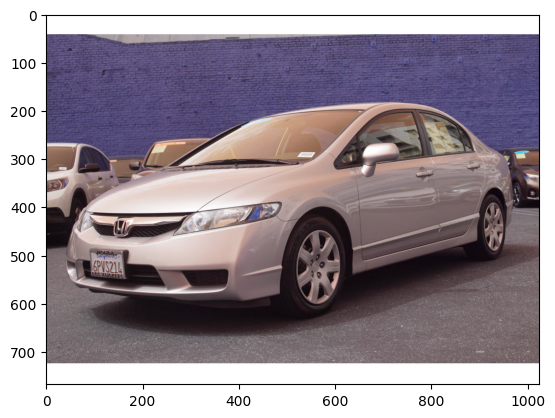

>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
/content/drive/MyDrive/data/3_4th_passenger_side_front--> Total images:  500
Image_shape:  (768, 1024, 3)
Image_dimensions:  3
Image_size:  2359296


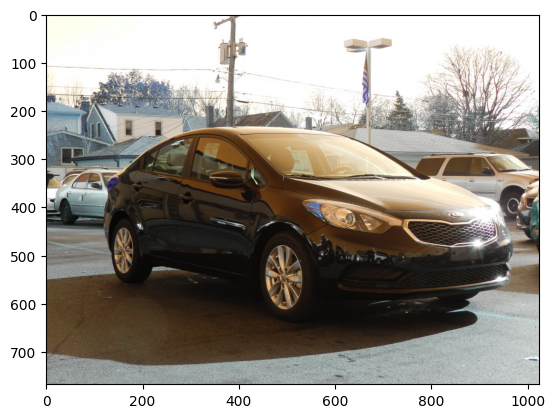

>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
/content/drive/MyDrive/data/front--> Total images:  500
Image_shape:  (768, 1024, 3)
Image_dimensions:  3
Image_size:  2359296


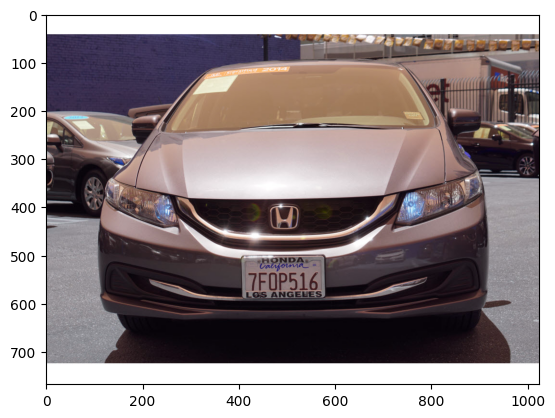

>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
/content/drive/MyDrive/data/driver_side--> Total images:  500
Image_shape:  (480, 640, 3)
Image_dimensions:  3
Image_size:  921600


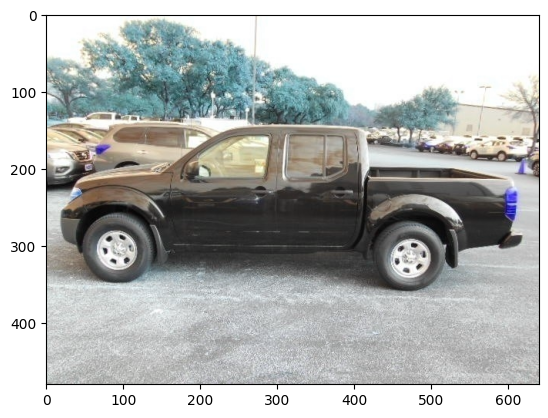

>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
/content/drive/MyDrive/data/3_4th_passenger_side_rear--> Total images:  500
Image_shape:  (480, 640, 3)
Image_dimensions:  3
Image_size:  921600


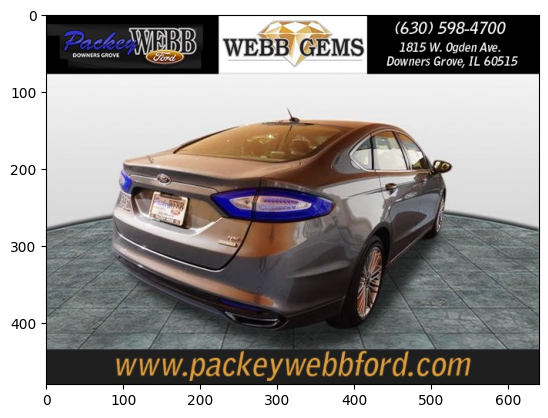

>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
/content/drive/MyDrive/data/rear--> Total images:  500
Image_shape:  (480, 640, 3)
Image_dimensions:  3
Image_size:  921600


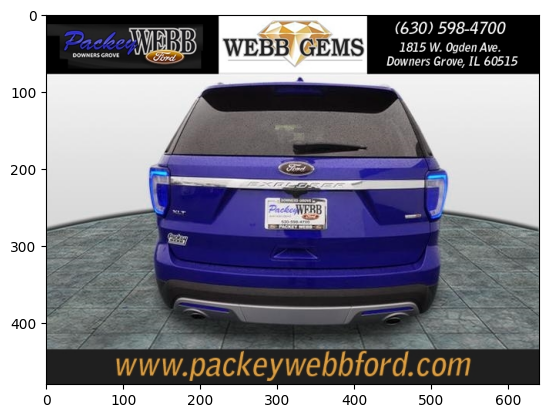

In [56]:
data_path = r"/content/drive/MyDrive/data" # path to the main folder
paths = []
for folder in os.listdir(data_path):
    folder_path = os.path.join(data_path,folder)
    paths.append(folder_path)
    if os.path.isdir(folder_path):
        files = os.listdir(folder_path)

        Images = [file for file in files if file.endswith('.jpg') or file.endswith('.png')]
        total_files = len(Images)
        print('>>'*50)
        print(f'{folder_path}--> Total images: ', total_files)

        for i in range(1,2):
            img = cv2.imread(folder_path+"/"+files[i])
            print('Image_shape: ',img.shape)
            print('Image_dimensions: ',img.ndim)
            print('Image_size: ',img.size)
            plt.imshow(img,cmap='cividis')
            plt.show()

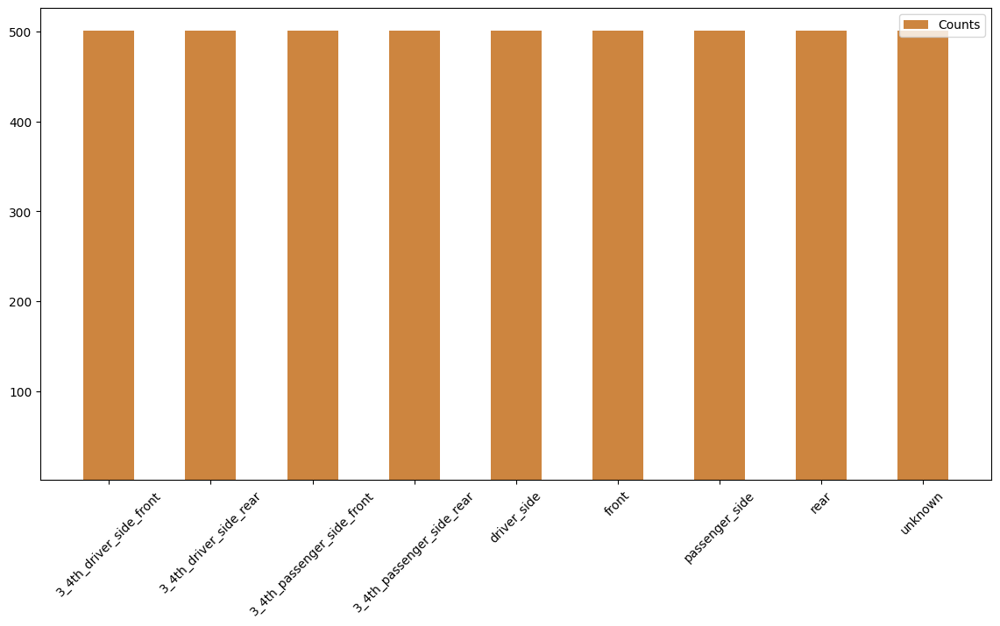

In [57]:
car_angles = ['3_4th_driver_side_front','3_4th_driver_side_rear','3_4th_passenger_side_front','3_4th_passenger_side_rear',
                'driver_side','front','passenger_side','rear','unknown']
values = [500,500,500,500,500,500,500,500,500]
plt.figure(figsize=(14,7))
plt.bar(car_angles,values,width=0.5,bottom=1,label='Counts',color='Peru')
plt.xticks(car_angles,rotation=45)
plt.legend();

In [58]:
one_path = paths[0]
one_path

'/content/drive/MyDrive/data/3_4th_driver_side_rear'

In [59]:
!pip install basic-image-eda


found 500 images.
Using 2 threads. (max:2)



100%|██████████| 500/500 [00:59<00:00,  8.36it/s]



*--------------------------------------------------------------------------------------*
number of images                         |  500

dtype                                    |  uint8
channels                                 |  [3]
extensions                               |  ['jpg']

min height                               |  480
max height                               |  768
mean height                              |  705.216
median height                            |  768

min width                                |  640
max width                                |  1024
mean width                               |  940.288
median width                             |  1024

mean height/width ratio                  |  0.75
median height/width ratio                |  0.75
recommended input size(by mean)          |  [704 944] (h x w, multiples of 8)
recommended input size(by mean)          |  [704 944] (h x w, multiples of 16)
recommended input size(by mean)          |  [704 928] (h x 

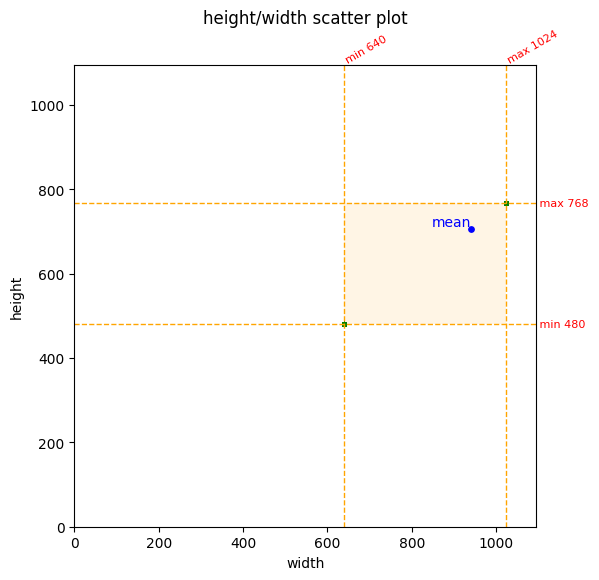

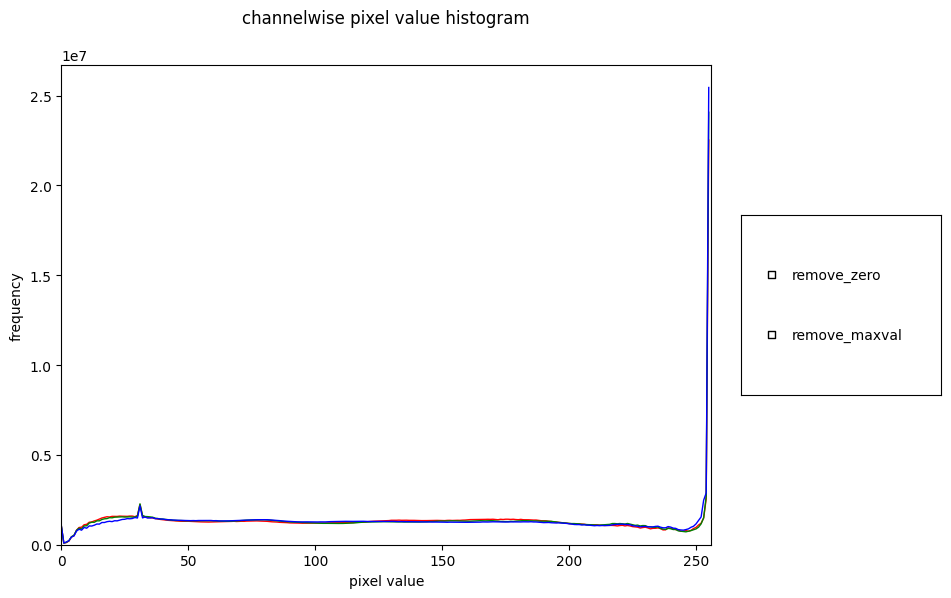

{'dtype': 'uint8',
 'channels': [3],
 'extensions': ['jpg'],
 'min_h': 480,
 'max_h': 768,
 'mean_h': 705.216,
 'median_h': 768,
 'min_w': 640,
 'max_w': 1024,
 'mean_w': 940.288,
 'median_w': 1024,
 'mean_hw_ratio': 0.75,
 'median_hw_ratio': 0.75,
 'rec_hw_size_8': array([704, 944]),
 'rec_hw_size_16': array([704, 944]),
 'rec_hw_size_32': array([704, 928]),
 'mean': array([0.5118525 , 0.51297307, 0.5218227 ], dtype=float32),
 'std': array([0.2986764 , 0.30122817, 0.30201122], dtype=float32)}

In [60]:
from basic_image_eda import BasicImageEDA
extensions = ['jpg']
threads = 0
dimension_plot = True
channel_hist = True
nonzero = False
BasicImageEDA.explore(one_path,extensions,threads,dimension_plot,channel_hist,nonzero,hw_division_factor=1.0)

### Observations:
* There are `9 sub-folders` in the main `data` folder each containing `500` images, which make a total of `4500` images
* The images category is auto-mobile - Car, the images represent pictures of cars at different angles such as `driver_side_front`,`driver_side_rear` etc.
* The images are `BGR` represents three channels/dimensions depth-wise, The largest size of a image is `2359296 bytes`
* We can also see that images in a sub-folder maintain the same `image shape` throughout the sub-folder and will be different from another.
> If you look at the Images carefully, In some categories there is noise as `advertisement details`. We need to crop images to get rid of that noise which will effects on the model in classifying the images. We need to be careful while cropping because the image shape in each sub-folder is different.

## Image data Analysis for Preprocessing

> Later in this case study we will be performing image augmentation using keras `ImageDataGenerator` for which the Analysis part is very crucial for the effective preprocessing to include.

### Cropping

**As the shape of the images is different in each sub-folder, effetive cropping wont be possible. For that lets resize all the images with the highest image shape among all the sub-folders i.e (768, 1024, 3)**

Image_shape:  (580, 1024, 3)
Image_size:  1781760


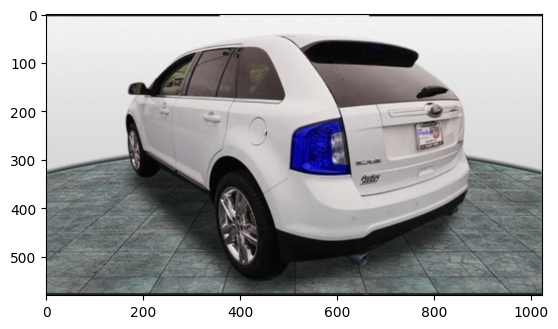

Image_shape:  (580, 1024, 3)
Image_size:  1781760


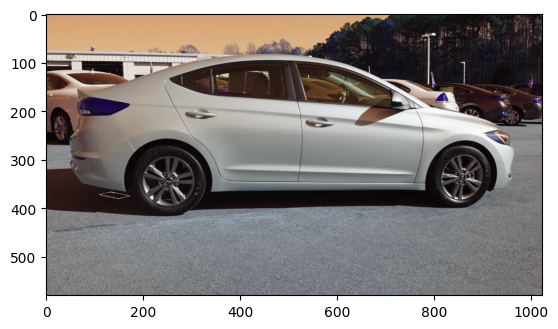

Image_shape:  (580, 1024, 3)
Image_size:  1781760


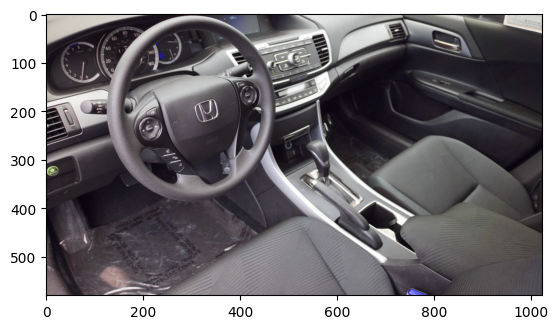

Image_shape:  (580, 1024, 3)
Image_size:  1781760


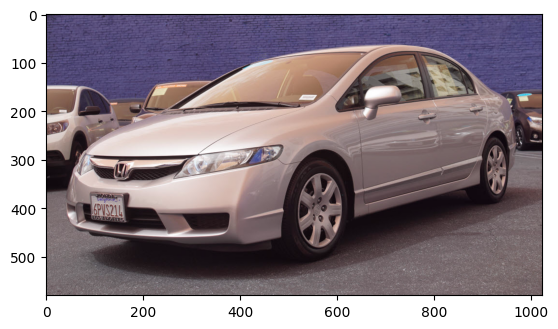

Image_shape:  (580, 1024, 3)
Image_size:  1781760


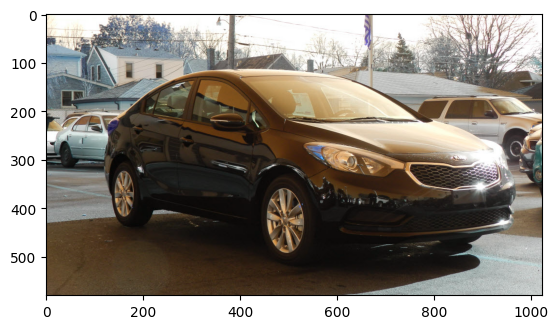

Image_shape:  (580, 1024, 3)
Image_size:  1781760


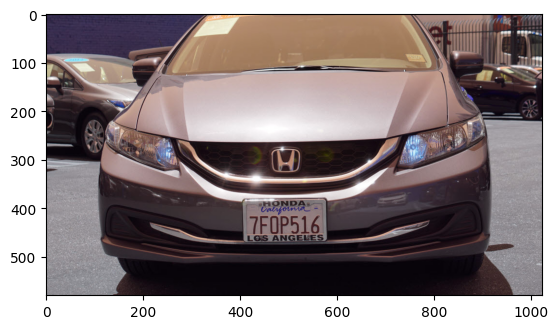

Image_shape:  (580, 1024, 3)
Image_size:  1781760


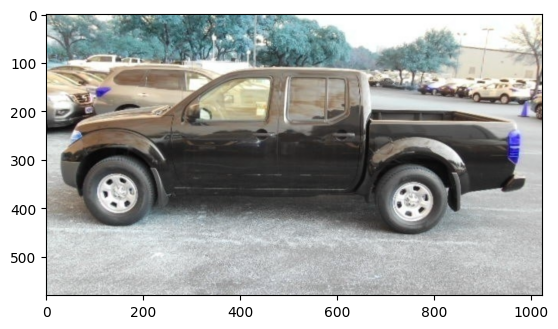

Image_shape:  (580, 1024, 3)
Image_size:  1781760


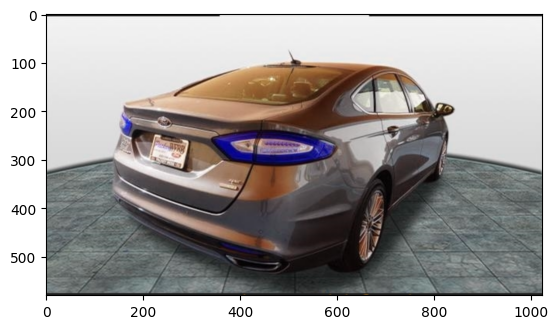

Image_shape:  (580, 1024, 3)
Image_size:  1781760


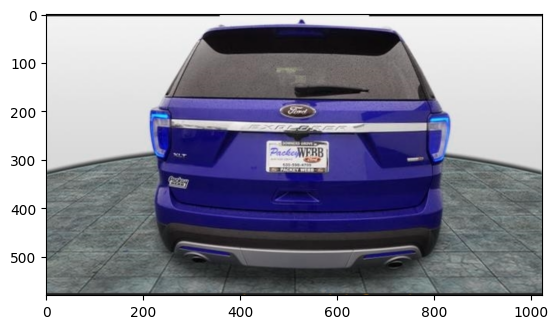

In [61]:
# Let's try to crop the images from each sub folder and see whether we are able to get rid of the noise.
# Later the same can be implemented while doing image augmentation
for path in paths:
    files = os.listdir(path)
    for i in range(1,2):
        img = cv2.imread(path+"/"+files[i])
        resize_img = cv2.resize(img,(1024,768))
        # Define coordinates to crop the image
        X,Y,W,H =0,120,1024,580
        croped_img = resize_img[Y:Y+H, X:X+W]
        print('Image_shape: ',croped_img.shape)
        print('Image_size: ',croped_img.size)
        plt.imshow(croped_img,cmap='viridis')
        plt.show()

### Observations:
* You can now see that resizing the images to `(1024,768)` and then cropping them with coordinates `X,Y,W,H =0,120,1024,580`, effetively reduced the noise while preserving the image.
* The new image shape is `(580, 1024, 3)` and size is `1781760` which has reduced comparatively

**Lets create a new folder `croped_images` and `9 sub-folders` with the same names, take images from the original data folder and resize them, crop them and save them to the respective sub-folders of cropped_images folder**
* We will now use these images when we do the image augmentation

### See the below code

In [62]:
paths

['/content/drive/MyDrive/data/3_4th_driver_side_rear',
 '/content/drive/MyDrive/data/passenger_side',
 '/content/drive/MyDrive/data/unknown',
 '/content/drive/MyDrive/data/3_4th_driver_side_front',
 '/content/drive/MyDrive/data/3_4th_passenger_side_front',
 '/content/drive/MyDrive/data/front',
 '/content/drive/MyDrive/data/driver_side',
 '/content/drive/MyDrive/data/3_4th_passenger_side_rear',
 '/content/drive/MyDrive/data/rear']

In [63]:
# folder_names = ['3_4th_driver_side_rear','passenger_side','unknown','3_4th_driver_side_front',
#                 '3_4th_passenger_side_front','front','driver_side','3_4th_passenger_side_rear','rear']
# new_folder = r"/content/drive/MyDrive/Cropped_images"

# for path in range(len(paths)):
#     files = os.listdir(paths[path])
#     new_folder = r"/content/drive/MyDrive/Cropped_images"+'/'+folder_names[path]
#     if not os.path.exists(new_folder):
#         os.makedirs(new_folder)
#     for i in files:
#         img = cv2.imread(paths[path]+"/"+i)
#         resize_img = cv2.resize(img,(1024,768))
#         # Define coordinates to crop the image
#         X,Y,W,H =0,120,1024,580
#         croped_img = resize_img[Y:Y+H, X:X+W]
#         file_name = os.path.join(new_folder, i)
#         cv2.imwrite(file_name, croped_img)

* You can observe that the quality of the images is not upto the mark, so lets try to improve the quality.

### Enhancements and Filterings

In [64]:
newdata_path = r"/content/drive/MyDrive/Cropped_images" # path to the main folder
New_paths = []
for folder in os.listdir(newdata_path):
    folder_path = os.path.join(newdata_path,folder)
    New_paths.append(folder_path)

In [65]:
New_paths[0:2]

['/content/drive/MyDrive/Cropped_images/3_4th_driver_side_rear',
 '/content/drive/MyDrive/Cropped_images/passenger_side']

**The `convertScaleAbs` allows you to adjust the contrast (alpha) and brightness (beta) of an image. Increase alpha for higher contrast and adjust beta for brightness control.**

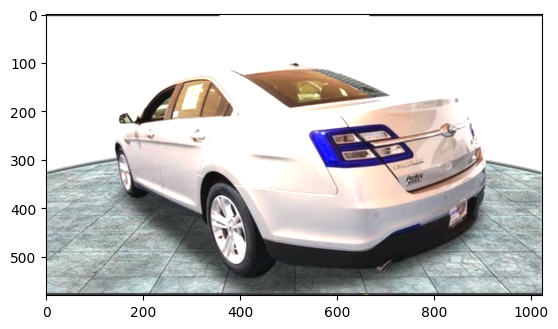

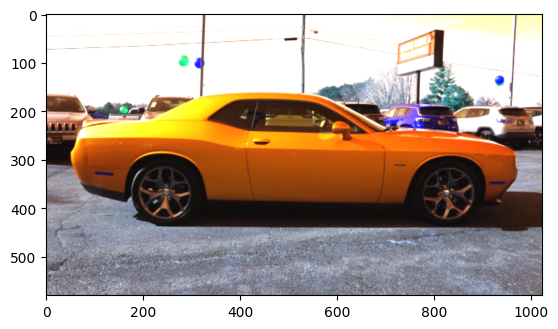

In [66]:
for path in New_paths[0:2]:
    files = os.listdir(path)
    for i in range(1,2):
        img = cv2.imread(path+"/"+files[i])
        enhance_img = cv2.convertScaleAbs(img, alpha=1.5, beta=10)
        plt.imshow(enhance_img,cmap='viridis')
        plt.show()

In [67]:
# Enhancing the image contrast and Applying GaussianBlur Filter Using PIL Library

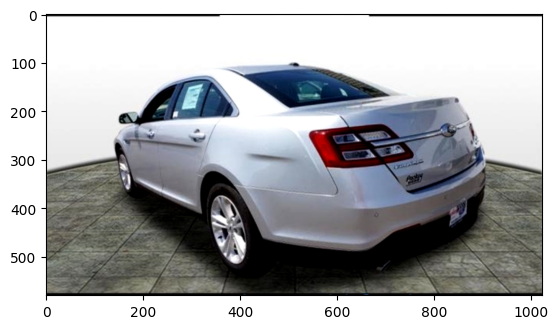

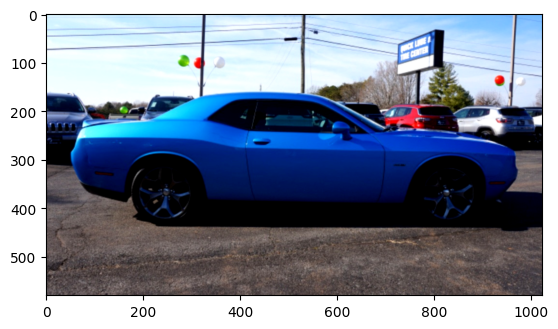

In [68]:
# Using PIL Library
for path in New_paths[0:2]:
    files = os.listdir(path)
    for i in range(1,2):
        img = Image.open(path+'/'+files[i])
        enhancer = ImageEnhance.Contrast(img)
        enhance_img = enhancer.enhance(1.25)
        blur_img = enhance_img.filter(ImageFilter.GaussianBlur(radius=0.5))
        plt.imshow(blur_img,cmap='viridis')
        plt.show()

**The following enhancement equalizes the histogram of an image, improving contrast by spreading out the pixel intensities.**

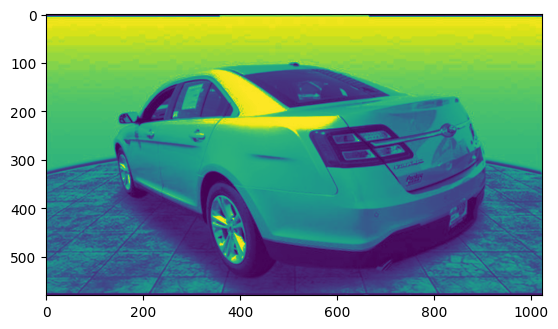

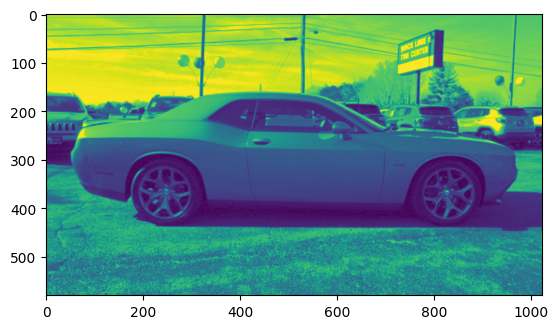

In [69]:
for path in New_paths[0:2]:
    files = os.listdir(path)
    for i in range(1,2):
        img = cv2.imread(path+"/"+files[i],cv2.IMREAD_GRAYSCALE)
        enhance_img = cv2.equalizeHist(img)
        plt.imshow(enhance_img,cmap='viridis')
        plt.show()

**The following applies bilateral filtering, which preserves edges while smoothing noise.**

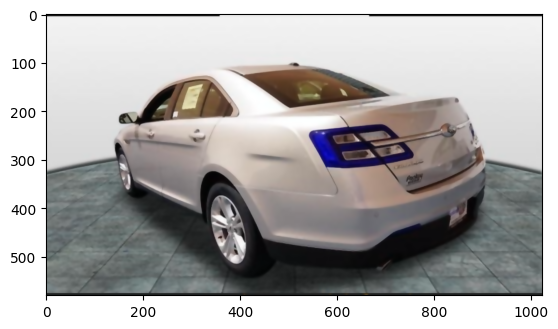

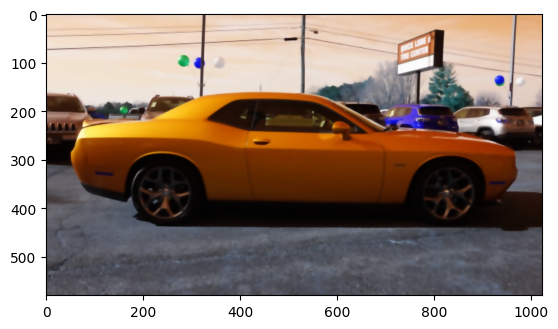

In [70]:
for path in New_paths[0:2]:
    files = os.listdir(path)
    for i in range(1,2):
        img = cv2.imread(path+"/"+files[i])
        enhance_img = cv2.bilateralFilter(img, 9, 75, 75)
        plt.imshow(enhance_img,cmap='viridis')
        plt.show()

**Let's do the flipping**

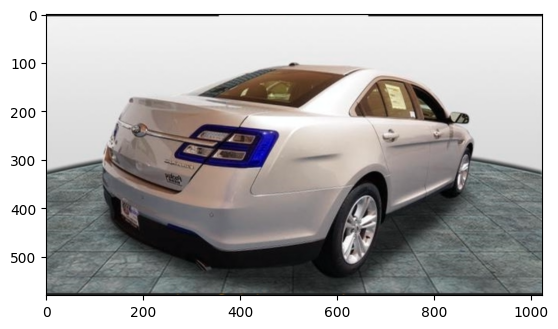

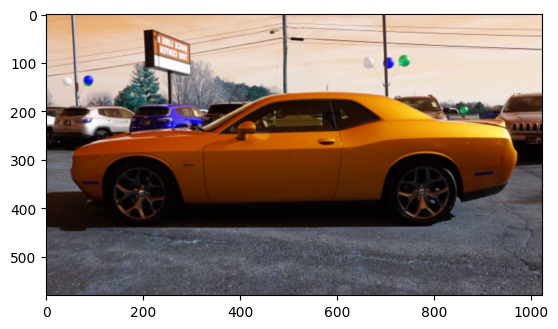

In [71]:
for path in New_paths[0:2]:
    files = os.listdir(path)
    for i in range(1,2):
        img = cv2.imread(path+"/"+files[i])
        flip_img = cv2.flip(img, 1)
        plt.imshow(flip_img,cmap='viridis')
        plt.show()

### Observations:
* We can apply `enhancements and filtering` on the images to make their quality and observance better for the model to capture the features effectively, While performing the augmentation we will be specifying the target size where the image size will be reduced thus increasing quality cause the pixcels contract (`Interpolation is must`)
* `Flipping` is purely eliminated cause it changes the angle of the cars in images which leads to mis-classifications.
* Based on the above analysis, we should use little `zoom range, shear range and scalling` for better outcomes and performance

## Splitting Data

> Training data - 400, Validation data - 50, Testing data - 50

In [72]:
New_paths

['/content/drive/MyDrive/Cropped_images/3_4th_driver_side_rear',
 '/content/drive/MyDrive/Cropped_images/passenger_side',
 '/content/drive/MyDrive/Cropped_images/unknown',
 '/content/drive/MyDrive/Cropped_images/3_4th_driver_side_front',
 '/content/drive/MyDrive/Cropped_images/3_4th_passenger_side_front',
 '/content/drive/MyDrive/Cropped_images/front',
 '/content/drive/MyDrive/Cropped_images/driver_side',
 '/content/drive/MyDrive/Cropped_images/3_4th_passenger_side_rear',
 '/content/drive/MyDrive/Cropped_images/rear']

### Training_split - 80%

In [73]:
# Split data 80% training, 10% Validation, 10% testing
#We will be using cropped images from the cropped_image folder to make the split


# folder_names = ['3_4th_driver_side_rear','passenger_side','unknown','3_4th_driver_side_front',
#                  '3_4th_passenger_side_front','front','driver_side','3_4th_passenger_side_rear','rear']
# Train_folder = r"/content/drive/MyDrive/train_folder"
# for path in range(len(New_paths)):
#     files = os.listdir(New_paths[path])
#     new_folder = Train_folder+'/'+folder_names[path]
#     if not os.path.exists(new_folder):
#         os.makedirs(new_folder)
#     for i in range(0,400):
#         img_ = cv2.imread(New_paths[path]+'/'+files[i])
#         file_name = os.path.join(new_folder,files[i])
#         cv2.imwrite(file_name,img_)

### Validation_split - 10%

In [74]:
# folder_names = ['3_4th_driver_side_rear','passenger_side','unknown','3_4th_driver_side_front',
#                  '3_4th_passenger_side_front','front','driver_side','3_4th_passenger_side_rear','rear']
# validation_folder = r"/content/drive/MyDrive/validation_folder"
# for path in range(len(New_paths)):
#     files = os.listdir(New_paths[path])
#     new_folder = validation_folder+'/'+folder_names[path]
#     if not os.path.exists(new_folder):
#         os.makedirs(new_folder)
#     for i in range(400,450):
#         img_ = cv2.imread(New_paths[path]+'/'+files[i])
#         file_name = os.path.join(new_folder,files[i])
#         cv2.imwrite(file_name,img_)

### Testing_split - 10%

In [75]:
# folder_names = ['3_4th_driver_side_rear','passenger_side','unknown','3_4th_driver_side_front',
#                  '3_4th_passenger_side_front','front','driver_side','3_4th_passenger_side_rear','rear']
# test_folder = r"/content/drive/MyDrive/testing_folder"
# for path in range(len(New_paths)):
#     files = os.listdir(New_paths[path])
#     new_folder = test_folder+'/'+folder_names[path]
#     if not os.path.exists(new_folder):
#         os.makedirs(new_folder)
#     for i in range(450,500):
#         img_ = cv2.imread(New_paths[path]+'/'+files[i])
#         file_name = os.path.join(new_folder,files[i])
#         cv2.imwrite(file_name,img_)

## Define Generator

In [79]:
# Clear any logs from previous runs
!rm -rf ./logs/

In [80]:
Training_images = r"/content/drive/MyDrive/train_folder"
validation_images = r"/content/drive/MyDrive/validation_folder"
Testing_images = r"/content/drive/MyDrive/testing_folder"

In [81]:
# add pre-processing, augmentation
datagen = ImageDataGenerator(
    shear_range=0.2,
    zoom_range = 0.1,
    rescale=1.0/255,
    brightness_range=(0.8,0.8),
    interpolation_order=1
    )

test_gen = ImageDataGenerator()

train_generator = datagen.flow_from_directory(
    Training_images,
    target_size=(100,100),
    batch_size=30,
    class_mode='categorical'

)

validation_generator = datagen.flow_from_directory(
    validation_images,
    target_size=(100,100),
    batch_size=30,
    class_mode='categorical'
)

Test_generator = test_gen.flow_from_directory(
    Testing_images,
    target_size=(100,100),
    batch_size=30,
    class_mode = 'categorical'

)
train_generator.class_indices

Found 3600 images belonging to 9 classes.
Found 450 images belonging to 9 classes.
Found 450 images belonging to 9 classes.


{'3_4th_driver_side_front': 0,
 '3_4th_driver_side_rear': 1,
 '3_4th_passenger_side_front': 2,
 '3_4th_passenger_side_rear': 3,
 'driver_side': 4,
 'front': 5,
 'passenger_side': 6,
 'rear': 7,
 'unknown': 8}

**If you observe, the above dictionary is having keys as face_names and values as numbers. We need to swap them because the classifier model will return the answer as the numeric mapping and we need to get the face_name out of it.**

> Also, since this is a multi-class classification problem, we are counting the number of unique faces, as that will be used as the number of output neurons in the output layer of fully connected ANN classifier.

In [82]:
# training_data have numeric tag for each face
indeces = train_generator.class_indices

# lets store them in a dictionary with swap for future reference
Result_class = {}
for value_tag, face_tag in zip(indeces.values(),indeces.keys()):
    Result_class[value_tag] = face_tag
# use pickle to save the mapping's
#import pickle
#with open(r'E:\121\Sr.DS Assgn\ResultMap.pkl','wb') as Final_mapping:
#    pickle.dump(Result_class,Final_mapping)

In [83]:
Result_class

{0: '3_4th_driver_side_front',
 1: '3_4th_driver_side_rear',
 2: '3_4th_passenger_side_front',
 3: '3_4th_passenger_side_rear',
 4: 'driver_side',
 5: 'front',
 6: 'passenger_side',
 7: 'rear',
 8: 'unknown'}

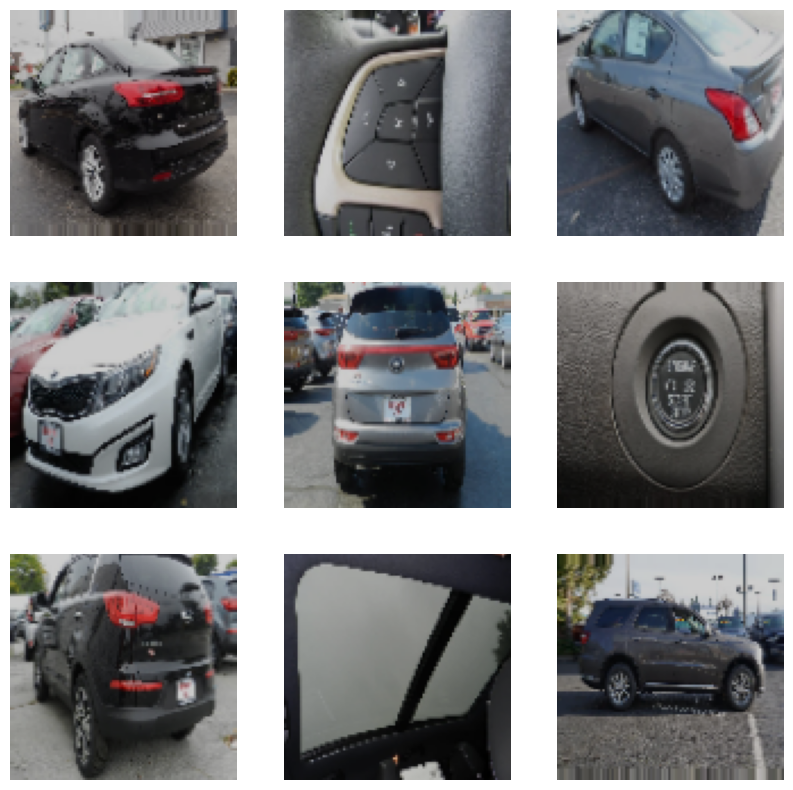

In [84]:
# Lets view batch of images to see how they look
batch = train_generator.next()
images, labels = batch
plt.figure(figsize=(10, 10))
for i in range(min(9, images.shape[0])):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i])
    plt.axis("off");
plt.show();

In [85]:
Output_Neurons=len(Result_class)
print('\n The Number of output neurons: ', Output_Neurons)


 The Number of output neurons:  9


## Define Model

### Updations/Adjustments for improving model performance
**Adding Dropout Layers and BatchNormalization layers to tackle with the problem of overfitting**

In [86]:
# add Fully connected last layers( as many as you like to improve the performance),
#try-out drop-out in Fully connected layers if you think it is necessary
def add_last_layer(model, n_classes, fc_layer_size,dropout_rate = 0.20):
    # Flatten the model output
    flag = Flatten()(model.output)
    # Add fully connected layers
    for size in fc_layer_size:
        flag = Dense(size,activation='relu')(flag)
        # Adding dropout layers with 0.25 percentage to over-come the issue of overfitting that might happen
        flag = Dropout(dropout_rate)(flag)
        # Also adding batchnormalization layers to tackle the model unstability due to distributions (Internal-covariate shift)
        flag = BatchNormalization()(flag)

    # Add final output layer with softmax activation for classification
    output = Dense(n_classes, activation=softmax)(flag)

    # Combine the base model and the new layers
    final_model = Model(inputs=model.input,outputs = output)

    return final_model


In [87]:
fc_layer_size = [32,64,128]

**I am using transfer-learning to load the pre-trained model - `Resnet50` using `"imagenet"` weights and input_shape as `(100,100,3)`.**

In [88]:
model = ResNet50(weights='imagenet', input_shape=(100,100, 3),include_top=False)

In [89]:
model = add_last_layer(model, Output_Neurons, fc_layer_size)

In [90]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 100, 100, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 106, 106, 3)          0         ['input_2[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 50, 50, 64)           9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 50, 50, 64)           256       ['conv1_conv[0][0]']          
 on)                                                                                        

## Compiling Model

In [91]:
#Add callbacks like early stopping, cyclical or variable learning rate or anyting you feel necessary
##add Code Here
opt = Adam(learning_rate=0.01, beta_1=0.9, beta_2=0.999, epsilon=1e-08, weight_decay=5e-04)
from keras.callbacks import EarlyStopping
call = EarlyStopping(
                    min_delta=0.005,
                    patience=5,
                     verbose=1
                    )

# Freeze some layers
for layer in model.layers[:15]:  # Replace N with the number of layers you want to freeze
    layer.trainable = False
##add model compile code here
'''Perform Model Compilation'''
model.compile(loss='categorical_crossentropy',optimizer = opt,metrics = [Precision(),Recall()])

## Training

In [92]:
#Freeze some layers first and then train the unfrozen layers it. (experiment with number of layers to freeze for best metrics)
#Next train all the layers


# Measuring the time taken by the model to train
StartTime=time.time()


# Define the Keras TensorBoard callback. Use the callback in model callbacks to log the model scalar values like loss, precision, recall etc.
logdir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = keras.callbacks.TensorBoard(log_dir=logdir)

history_tl = model.fit(
    train_generator,
    epochs = 10,
    validation_data=validation_generator,
    callbacks=[tensorboard_callback,call])


Endtime = time.time()
print('Total Training Time taken: ',round((Endtime-StartTime)/60),'Minutes')

Epoch 1/10
120/120 [==============================] - 884s 7s/step - loss: 2.3032 - precision_1: 0.3333 - recall_1: 0.0444 - val_loss: 2035.9286 - val_precision_1: 0.1111 - val_recall_1: 0.1111
Epoch 2/10
120/120 [==============================] - 813s 7s/step - loss: 1.9181 - precision_1: 0.4268 - recall_1: 0.0567 - val_loss: 2.8743 - val_precision_1: 0.0000e+00 - val_recall_1: 0.0000e+00
Epoch 3/10
120/120 [==============================] - 823s 7s/step - loss: 1.6184 - precision_1: 0.4884 - recall_1: 0.1286 - val_loss: 2.5637 - val_precision_1: 0.0000e+00 - val_recall_1: 0.0000e+00
Epoch 4/10
120/120 [==============================] - 821s 7s/step - loss: 1.3077 - precision_1: 0.4918 - recall_1: 0.2344 - val_loss: 6.6578 - val_precision_1: 0.1111 - val_recall_1: 0.1111
Epoch 5/10
120/120 [==============================] - 851s 7s/step - loss: 1.1252 - precision_1: 0.5106 - recall_1: 0.3278 - val_loss: 2.9205 - val_precision_1: 0.3333 - val_recall_1: 0.0022
Epoch 6/10
120/120 [======

In [93]:
%tensorboard --logdir logs

Reusing TensorBoard on port 6006 (pid 40968), started 3:04:19 ago. (Use '!kill 40968' to kill it.)

<IPython.core.display.Javascript object>

**Performing Serialization (save and load the model)**

In [98]:
import pickle
with open('/content/drive/MyDrive/model.pkl','wb') as file:
  pickle.dump(model,file)

In [ ]:
# with open('/content/drive/MyDrive/model.pkl','rb') as file:
#   Model = pickle.load(file)

## Testing

In [94]:
from keras.preprocessing import image
import numpy as np
import os
import glob

In [95]:
### Single Prediction ###
"""Use the model that is trained to make prediction on a single image from one of the category
 to see whether the predictions are good or not"""

Image_path = r"/content/drive/MyDrive/testing_folder/3_4th_driver_side_front/72629.jpg" #path of single image
test_image = image.load_img(Image_path,target_size = (100,100))
test_image = image.img_to_array(test_image) # converting image to array
test_image = np.expand_dims(test_image,axis = 0) # extracting array and making it a new axis or row

#using the model to predict
result = model.predict(test_image,verbose=0)
print('Prediction is: ',Result_class[np.argmax(result)])

Prediction is:  unknown


In [96]:
'''############ Making multiple predictions ###########'''

## Loading all the image paths from final testing folder for prediction
main_ = r"/content/drive/MyDrive/testing_folder"
img_paths = glob.glob(os.path.join(main_,'**','*.jpg'))

print(img_paths[0:5]) # every image will be a PIL object
print('*'*50)

for path in img_paths:
    test_image = image.load_img(path,target_size=(100,100))
    test_image = image.img_to_array(test_image)
    test_image = np.expand_dims(test_image,axis =0)
    result = model.predict(test_image,verbose=0)
    print('Prediction: ',Result_class[np.argmax(result)])

['/content/drive/MyDrive/testing_folder/3_4th_driver_side_rear/86696.jpg', '/content/drive/MyDrive/testing_folder/3_4th_driver_side_rear/86654.jpg', '/content/drive/MyDrive/testing_folder/3_4th_driver_side_rear/84910.jpg', '/content/drive/MyDrive/testing_folder/3_4th_driver_side_rear/85637.jpg', '/content/drive/MyDrive/testing_folder/3_4th_driver_side_rear/87773.jpg']
**************************************************
Prediction:  unknown
Prediction:  unknown
Prediction:  unknown
Prediction:  unknown
Prediction:  3_4th_driver_side_front
Prediction:  3_4th_driver_side_front
Prediction:  unknown
Prediction:  3_4th_driver_side_front
Prediction:  unknown
Prediction:  3_4th_driver_side_front
Prediction:  3_4th_passenger_side_front
Prediction:  3_4th_driver_side_front
Prediction:  unknown
Prediction:  3_4th_driver_side_front
Prediction:  3_4th_passenger_side_front
Prediction:  3_4th_driver_side_front
Prediction:  3_4th_driver_side_front
Prediction:  3_4th_driver_side_front
Prediction:  3_4th

## Observations:
* After the modifications you can that The model has become better in terms of predictions, now it is able to predict more classes rather than just passanger_side.
* Still you can see that there are a lot of mis-calssifications done by the model, may be due to high training loss and validation loss , in-sufficient data and in-sufficient training.
* With the amount of resources available, i believe i did the best i could.

## Improving Model

### Please add your thoughts on way to improve the model.
* Trying out the variations of hyper-parameters such as batch_size, Optimizer and activation functions.
* Perform the most apprropriate preprocessing based on the data at hand and task, takes experimentation.
* Going for a deeper architecture model if has enough resources to run it.
* As we know deep-learning is hungry for data, its always suggested to have more data to train our model to achieve better performace

**End of Project**